In [1]:
from PIL import Image, ImageDraw
import math
import colorsys

In [163]:
dimensions = (800, 800)
scale = 1.0/(dimensions[0]/3)
print(scale)
# center = (2.2, 1.5)       # Use this for Mandelbrot set
center = (1.5, 1.5)       # Use this for Julia set
iterate_max = 100
colors_max = 50

img = Image.new("RGB", dimensions)
d = ImageDraw.Draw(img)

# Calculate a tolerable palette
palette = [0] * colors_max
for i in range(colors_max):
    fo = 1-abs((float(i)/colors_max-1)**15)
    r, g, b = colorsys.hsv_to_rgb(.66+fo/3, 1-fo/2, fo)
    palette[i] = (int(r*255), int(g*255), int(b*255))

# Calculate the mandelbrot sequence for the point c with start value z
def iterate_mandelbrot(c, z = 0):
    for n in range(iterate_max + 1):
        z = z*z +c
        if abs(z) > 2:
            return n
    return None

# Draw our image
for y in range(dimensions[1]):
    for x in range(dimensions[0]):
        c = complex(x * scale - center[0], y * scale - center[1])

        # n = iterate_mandelbrot(c)            # Use this for Mandelbrot set
        n = iterate_mandelbrot(complex(0.3, 0.6), c)  # Use this for Julia set

        if n is None:
            v = 1
        else:
            v = n/100.0

        d.point((x, y), fill = palette[int(v * (colors_max-1))])

del d

0.00375


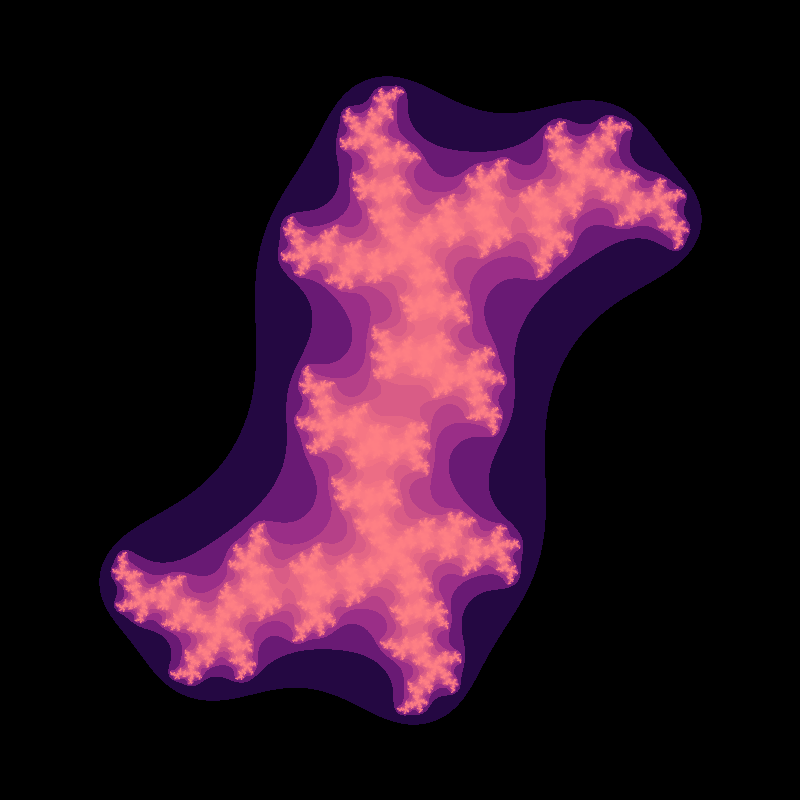

In [164]:
img

/usr/local/lib/python3.6/dist-packages/matplotlib/colors.py:1171: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


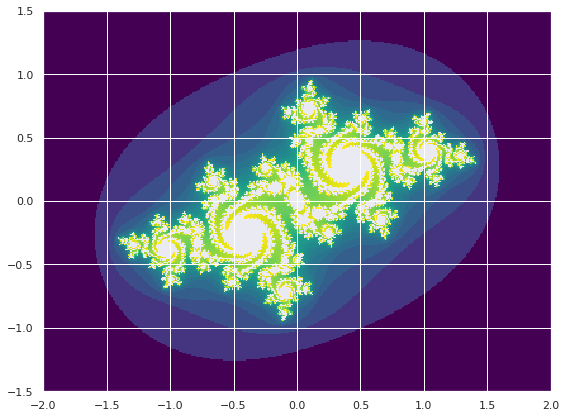

In [251]:
from pylab import *
from numpy import NaN
from matplotlib.colors import LogNorm

# seed parameter from https://commons.wikimedia.org/wiki/File:Julia_set_%28red%29.png
s = -0.512511498387847167, 0.521295573094847167

res = .01    # grid resolution
max_it = 100 # maximum number of iterations

figure(figsize = (10, 7))

def jul(a):
	z = a
	for n in range(1, max_it + 1):
		z = z**2 + s[0] + 1j * s[1]
		if abs(z) > 2:
			return n
	return NaN

X = arange(-2, 2 + res, res)
Y = arange(-1.5,  1.5 + res, res)
Z = zeros((len(Y), len(X)))

for iy, y in enumerate(Y):
	
    # print (iy + 1, "of", len(Y))
	for ix, x in enumerate(X):
		Z[iy, ix] = jul(x + 1j * y)

save("julia", Z)	# save array to file

imshow(Z, cmap = plt.cm.viridis, interpolation = 'none', norm = LogNorm(),
  extent = (X.min(), X.max(), Y.min(), Y.max()))

/usr/local/lib/python3.6/dist-packages/matplotlib/colors.py:1171: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


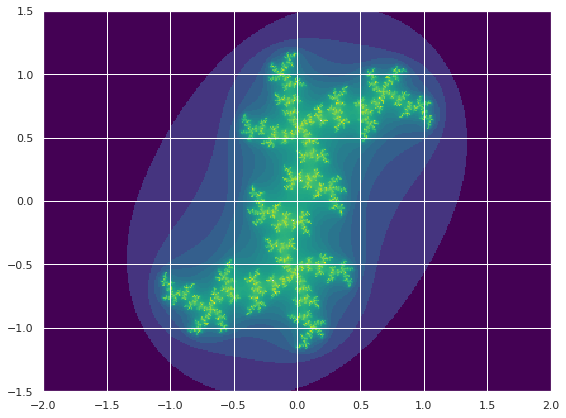

In [250]:
from pylab import *
from numpy import NaN
from matplotlib.colors import LogNorm

# seed parameter from https://commons.wikimedia.org/wiki/File:Julia_set_%28red%29.png
s = 0.3, 0.6

res = .01    # grid resolution
max_it = 100 # maximum number of iterations

figure(figsize = (10, 7))

def jul(a):
	z = a
	for n in range(1, max_it + 1):
		z = z**2 + s[0] + 1j * s[1]
		if abs(z) > 2:
			return n
	return NaN

X = arange(-2, 2 + res, res)
Y = arange(-1.5,  1.5 + res, res)
Z = zeros((len(Y), len(X)))

for iy, y in enumerate(Y):
	
    # print (iy + 1, "of", len(Y))
	for ix, x in enumerate(X):
		Z[iy, ix] = jul(x + 1j * y)

save("julia", Z)	# save array to file

imshow(Z, cmap = plt.cm.viridis, interpolation = 'none', norm = LogNorm(),
  extent = (X.min(), X.max(), Y.min(), Y.max()))

## Experiments

For the Mandelbrot set, c instead differs for each pixel and is x + yi, where x and y are the image coordinates (as was also used for the initial z value). The Mandelbrot set can be considered a map of all Julia sets because it uses a different c at each location, as if transforming from one Julia set to another across space.

A specific Julia set can be defined by a point in the Mandelbrot set matching its constant c value, and the look of an entire Julia set is usually similar in style to the Mandelbrot set at that corresponding location. Points near the edges of the Mandelbrot set typically give the most interesting Julia sets.

The Mandelbrot set is the set of complex numbers $c$ for which the function

$$f_c(z) = z^2 + c$$

does not diverge when iterated from $z=0$

In [27]:
from PIL import Image
from tqdm.auto import tqdm
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import seaborn as sns
from functools import partial
sns.set()

In [4]:
def f(z, c, deg = 2):
    fc_z = np.power(z, deg) + c
    return fc_z

Remains Finite

In [81]:
c = 0
x0 = 0
x = x0
for iter in range(10):
    x = f(x, c)
    print(x)

0
0
0
0
0
0
0
0
0
0


Explodes

In [82]:
c = 1
x0 = 0
x = x0
for iter in range(10):
    x = f(x, c)
    print(x)

1
2
5
26
677
458330
210066388901
44127887745906175987802
1947270476915296449559703445493848930452791205
3791862310265926082868235028027893277370233152247388584761734150717768254410341175325352026


Remains Finite

In [83]:
c = -1
x0 = 0
x = x0
for iter in range(10):
    x = f(x, c)
    print(x)

-1
0
-1
0
-1
0
-1
0
-1
0


Remains Finite

In [84]:
c = -2
x0 = 0
x = x0
for iter in range(10):
    x = f(x, c)
    print(x)

-2
2
2
2
2
2
2
2
2
2


Explodes

In [85]:
c = -3
x0 = 0
x = x0
for iter in range(10):
    x = f(x, c)
    print(x)

-3
6
33
1086
1179393
1390967848446
1934791555410494424614913
3743418362887760317407541271559358491868341997566
14013181039605279591264794847619800328827486486508228624585427223970679113386904690548911149924353
196369242848752904504577349757383037612985153913926403695127571696161461858671590378676172613183100508515965688159271290398744912814063312708773431733253629540948671177132092342415536477622468606


Remains Finite, but with chaotic behaviour

In [86]:
c = -0.28
x0 = 0
x = x0
for iter in range(20):
    x = f(x, c)
    print(x)

-0.28
-0.2016
-0.23935744000000003
-0.2227080159166464
-0.2304011396464708
-0.22691531484960747
-0.22850943988670352
-0.22778343588266506
-0.22811470633748784
-0.2279636807525617
-0.22803256025774415
-0.22800115146229832
-0.22801547493186614
-0.22800894319159554
-0.2280119218246518
-0.2280105635058289
-0.2280111829297544
-0.2280109004589741
-0.22801102927188782
-0.22801097053037434


In [87]:
c = np.arange(-3, 3, 1)
x0 = np.zeros_like(c)
x = x0
arr = [x0]
for iter in range(15):
    x = f(x, c)
    arr.append(np.abs(x))

In [88]:
pd.DataFrame(np.array(arr), columns=c)

,-3,-2,-1,0,1,2
0,0,0,0,0,0,0
1,3,2,1,0,1,2
2,6,2,0,0,2,6
3,33,2,1,0,5,38
4,1086,2,0,0,26,1446
5,1179393,2,1,0,677,2090918
6,1390967848446,2,0,0,458330,4371938082726
7,4803239468103370753,2,1,0,210066388901,8919542782688501670
8,5896182132306350078,2,0,0,3275921592928522330,8557206234556948570
9,6885468643577020417,2,1,0,6521269100592521125,7113761450777878438


In [89]:
c = np.arange(-3, 3, 0.01)
x0 = np.zeros_like(c)
x = x0
arr = [x0]
for iter in range(10):
    x = f(x, c)
    arr.append(np.abs(x) < 20)

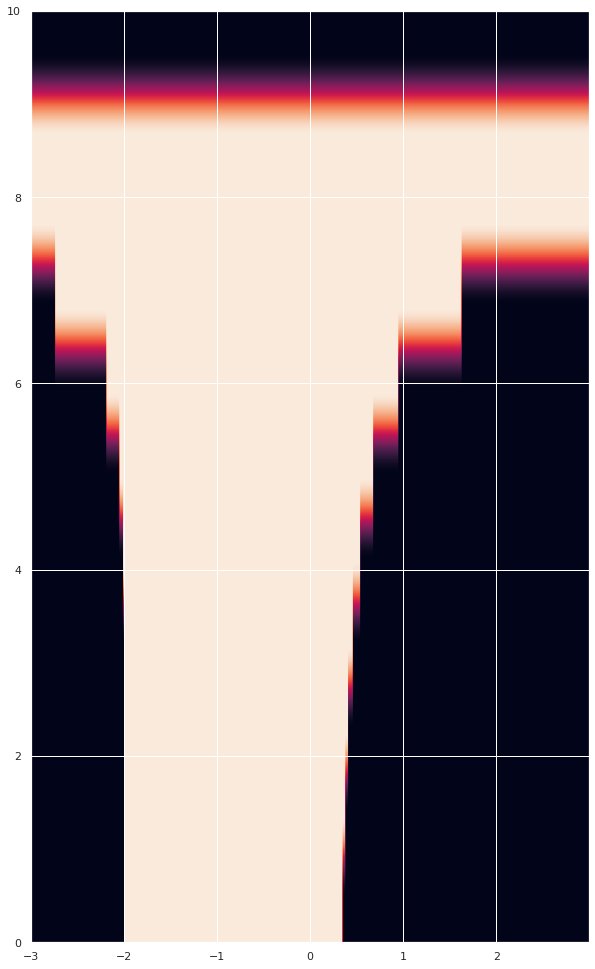

In [90]:
plt.figure(figsize=(10, 25))
plt.imshow(arr, extent=(c.min(), c.max(), 0, 10))

In [260]:
x_min, x_max = -2, 1
y_min, y_max = -1, 1

delta = 0.001

re, im = np.mgrid[x_min:x_max:delta, y_min:y_max:delta]

c = (re + 1j*im).T

x0 = np.zeros_like(c)
x = x0

for i in range(100):
    x = f(x, c)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in power
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in power
  


`np.abs` is required to convert the complex number to a real representation i.e. $x+iy = \sqrt{x^2+y^2}$

/usr/local/lib/python3.6/dist-packages/matplotlib/image.py:455: RuntimeWarning: overflow encountered in double_scalars
  newmin = vmid - dv * fact
/usr/local/lib/python3.6/dist-packages/matplotlib/image.py:460: RuntimeWarning: overflow encountered in double_scalars
  newmax = vmid + dv * fact


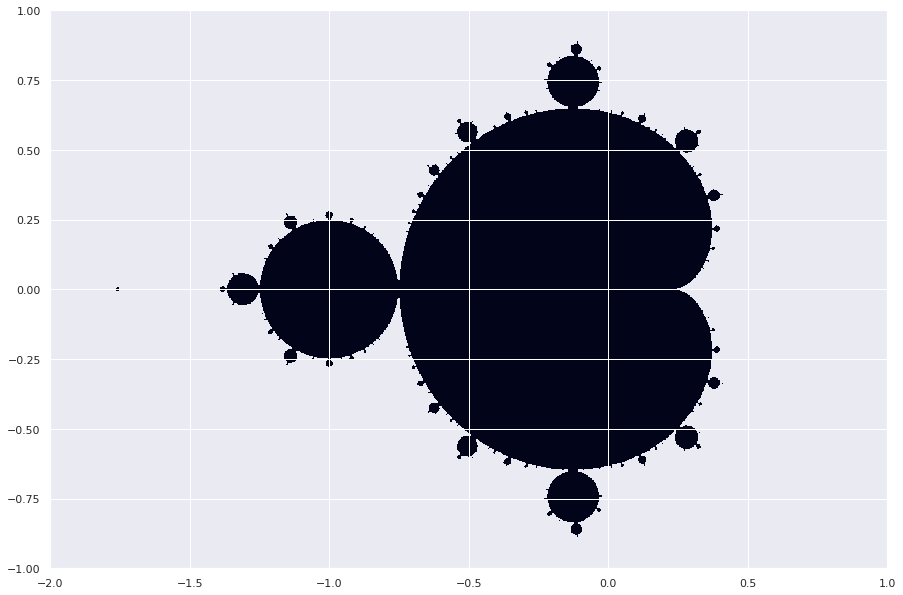

In [261]:
plt.figure(figsize=(15, 15))
plt.imshow(np.abs(x), extent=(x_min, x_max, y_min, y_max))

In [119]:
x_min, x_max = -2, 1
y_min, y_max = -1, 1

delta = 0.001

re, im = np.mgrid[x_min:x_max:delta, y_min:y_max:delta]

c = (re + 1j*im).T
escape = np.zeros_like(np.abs(c))
x0 = np.zeros_like(c)
x = x0

for i in range(100):
    x = f(x, c)
    idx = (np.abs(x) > 10) & (escape == 0)
    # print(idx, idx.shape, c.shape)
    # break
    escape[idx] = 100 - i

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in power
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in power
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:15: RuntimeWarning: overflow encountered in absolute
  from ipykernel import kernelapp as app
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in greater
  from ipykernel import kernelapp as app


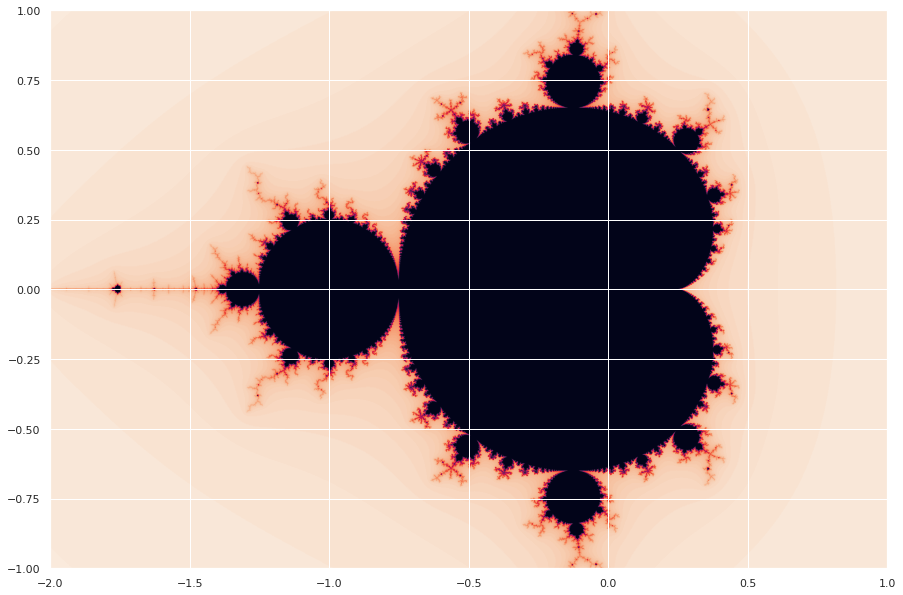

In [120]:
plt.figure(figsize=(15, 15))
plt.imshow(escape, extent=(x_min, x_max, y_min, y_max))

In [16]:
x_min, x_max = -1.5, 1.5
y_min, y_max = -1.5, 1.5

delta = 0.001

re, im = np.mgrid[x_min:x_max:delta, y_min:y_max:delta]

x = (re + 1j*im).T
escape = np.zeros_like(np.abs(x))
c = np.zeros_like(x)
c.fill(0.3 + 0.6j)

for i in range(100):
    x = f(x, c)
    idx = (np.abs(x) > 10) & (escape == 0)
    escape[idx] = i

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in power
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in power
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:15: RuntimeWarning: overflow encountered in absolute
  from ipykernel import kernelapp as app
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in greater
  from ipykernel import kernelapp as app


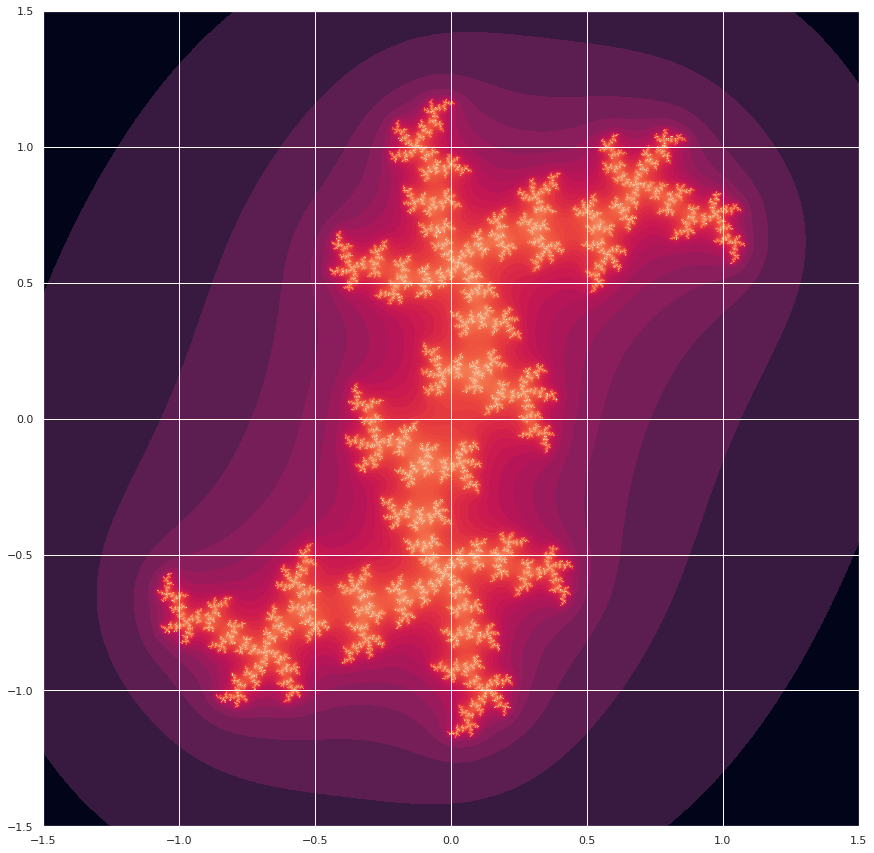

In [17]:
plt.figure(figsize=(15, 15))
plt.imshow(escape, extent=(x_min, x_max, y_min, y_max), interpolation = 'none', norm = LogNorm())

In [246]:
def plot_escape_fractal(x_min, x_max, y_min, y_max, const = 0 + 0j):
    delta = (x_max - x_min) / 500

    re, im = np.mgrid[x_min:x_max:delta, y_min:y_max:delta]

    c = (re + 1j*im).T
    escape = np.zeros_like(np.abs(c))
    x0 = np.ones_like(c)
    x = x0 * const

    for i in range(100):
        x = f(x, c)
        idx = (np.abs(x) > 10) & (escape == 0)
        escape[idx] = 100 - i
    
    plt.figure(figsize=(15, 15))
    plt.imshow(escape, extent=(x_min, x_max, y_min, y_max))
    plt.show()

def plot_escape_fractal_at(x, y, D, *args, **kwargs):
    return plot_escape_fractal(x-D, x+D, y-D, y+D, *args, **kwargs)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in power
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in power
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: overflow encountered in absolute
  del sys.path[0]
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: invalid value encountered in greater
  del sys.path[0]


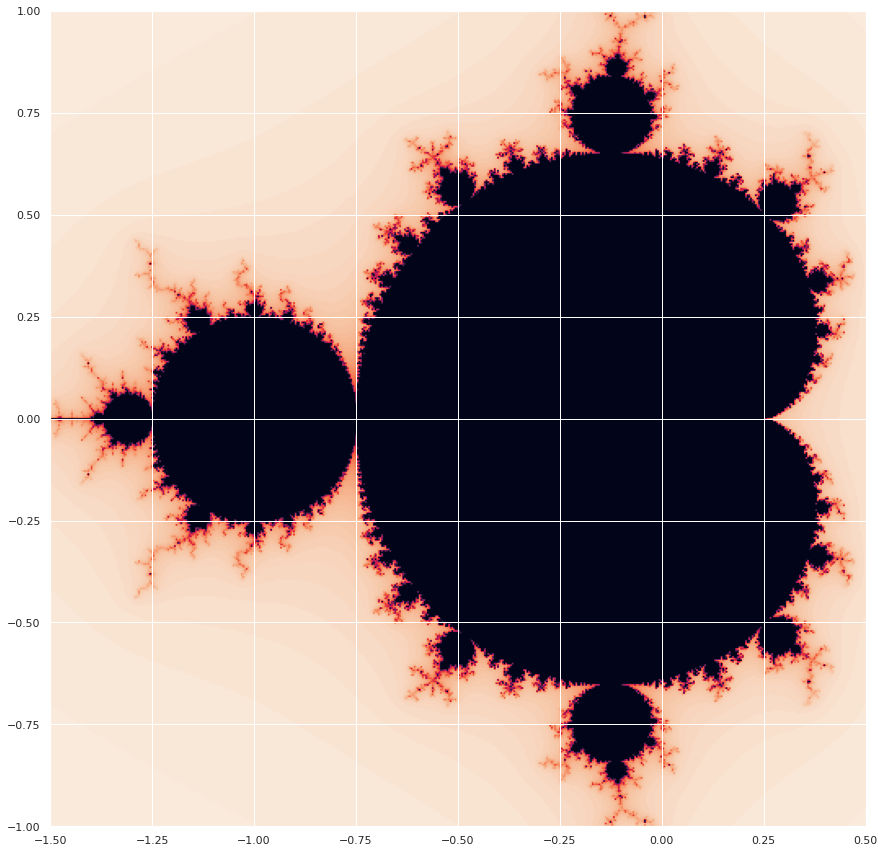

In [204]:
plot_escape_fractal_at(-.5, 0, 1)

In [126]:
x_min, x_max = -1.5, 1.5
y_min, y_max = -1.5, 1.5

delta = 0.001

re, im = np.mgrid[x_min:x_max:delta, y_min:y_max:delta]

c = (re + 1j*im).T
escape = np.zeros_like(np.abs(c))
x0 = np.zeros_like(c)
x = x0

for i in range(100):
    x = f(x, c, deg=6)
    idx = (np.abs(x) > 10) & (escape == 0)
    # print(idx, idx.shape, c.shape)
    # break
    escape[idx] = 100 - i

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in power
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in power
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:15: RuntimeWarning: overflow encountered in absolute
  from ipykernel import kernelapp as app
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in greater
  from ipykernel import kernelapp as app


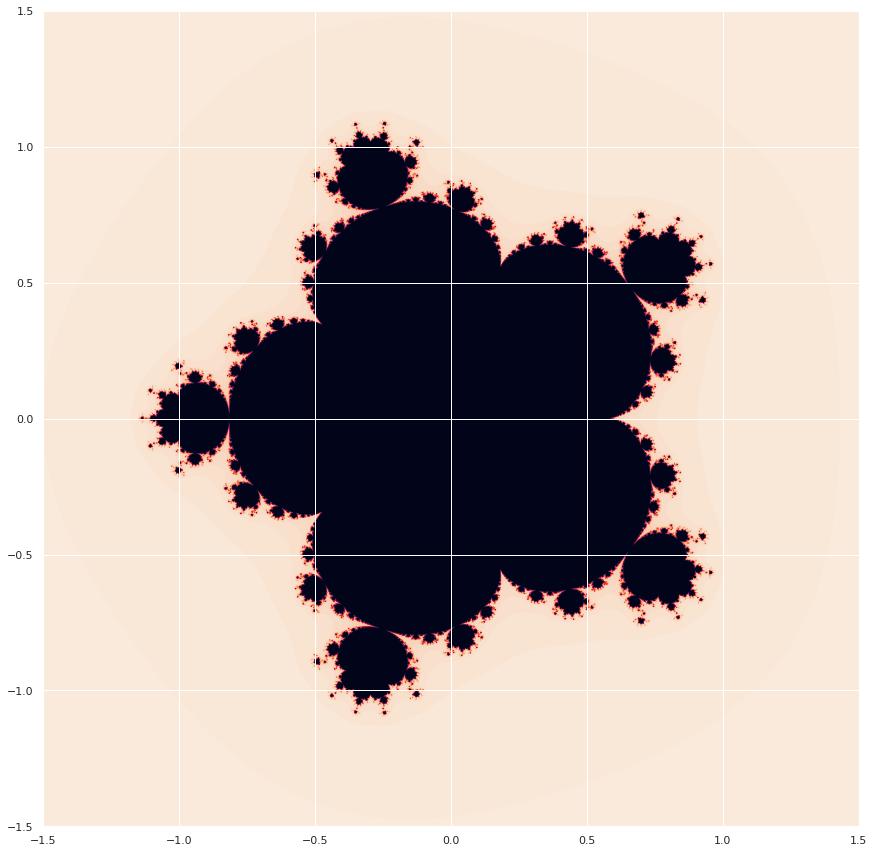

In [127]:
plt.figure(figsize=(15, 15))
plt.imshow(escape, extent=(x_min, x_max, y_min, y_max))

In [58]:
x_min, x_max = -1.5, 1.5
y_min, y_max = -1.5, 1.5

delta = 0.001

re, im = np.mgrid[x_min:x_max:delta, y_min:y_max:delta]

x = (re + 1j*im).T
escape = np.zeros_like(np.abs(x))
c = np.zeros_like(x)
c.fill(0.3 + 0.6j)

for i in range(100):
    x = f(x, c, deg=6)
    idx = (np.abs(x) > 10) & (escape == 0)
    escape[idx] = 100 - i

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in power
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in power
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:15: RuntimeWarning: overflow encountered in absolute
  from ipykernel import kernelapp as app
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in greater
  from ipykernel import kernelapp as app


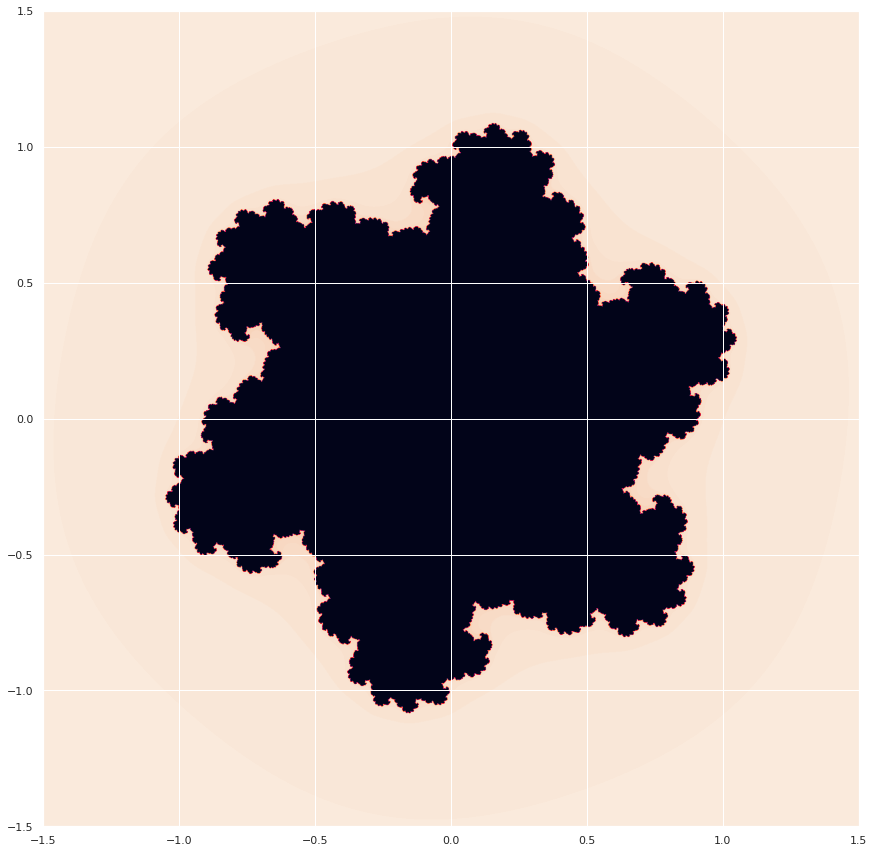

In [59]:
plt.figure(figsize=(15, 15))
plt.imshow(escape, extent=(x_min, x_max, y_min, y_max))

In [60]:
x_min, x_max = -1.5, 1.5
y_min, y_max = -1.5, 1.5

delta = 0.001

re, im = np.mgrid[x_min:x_max:delta, y_min:y_max:delta]

x = (re + 1j*im).T
escape = np.zeros_like(np.abs(x))
c = np.zeros_like(x)
c.fill(0.3 + 0.6j)

for i in range(100):
    x = f(x, c, deg=6)
    idx = (np.abs(x) > 10) & (escape == 0)
    escape[idx] = i

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in power
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in power
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:15: RuntimeWarning: overflow encountered in absolute
  from ipykernel import kernelapp as app
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in greater
  from ipykernel import kernelapp as app


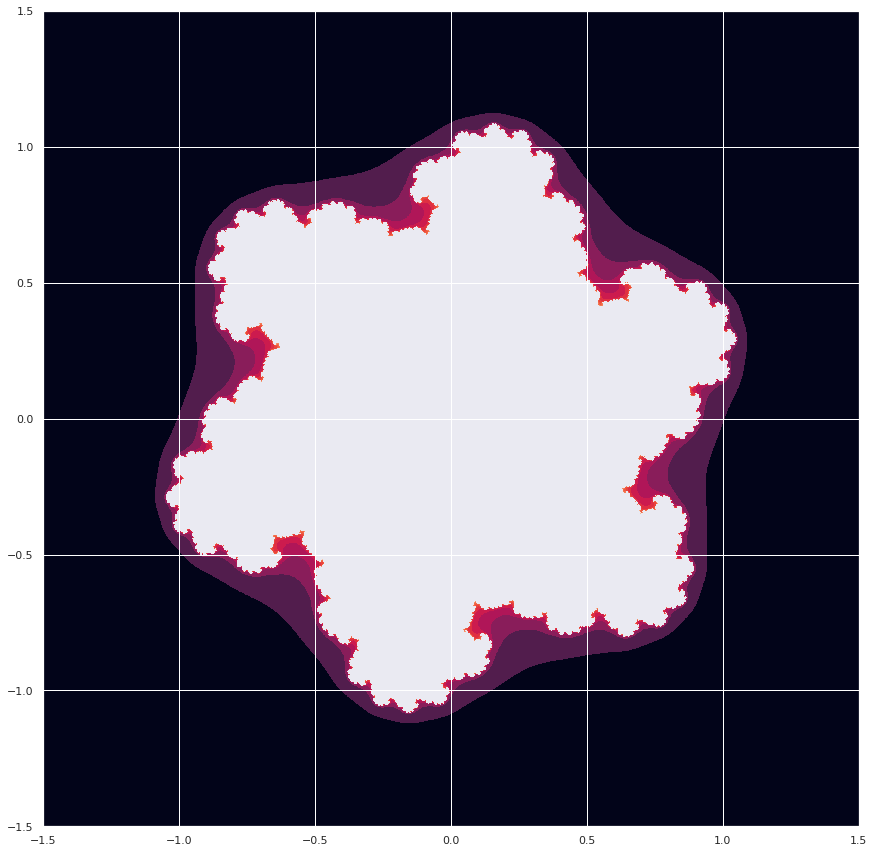

In [61]:
plt.figure(figsize=(15, 15))
plt.imshow(escape, extent=(x_min, x_max, y_min, y_max), interpolation = 'none', norm = LogNorm())

In [128]:
x_min, x_max = -1.5, 1.5
y_min, y_max = -1.5, 1.5

delta = 0.001

re, im = np.mgrid[x_min:x_max:delta, y_min:y_max:delta]

c = (re + 1j*im).T
escape = np.zeros_like(np.abs(c))
x0 = np.zeros_like(c)
x = x0

for i in range(100):
    x = f(x, c, deg=26)
    idx = (np.abs(x) > 10) & (escape == 0)
    escape[idx] = 100 - i

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in power
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in power
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:15: RuntimeWarning: overflow encountered in absolute
  from ipykernel import kernelapp as app
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in greater
  from ipykernel import kernelapp as app


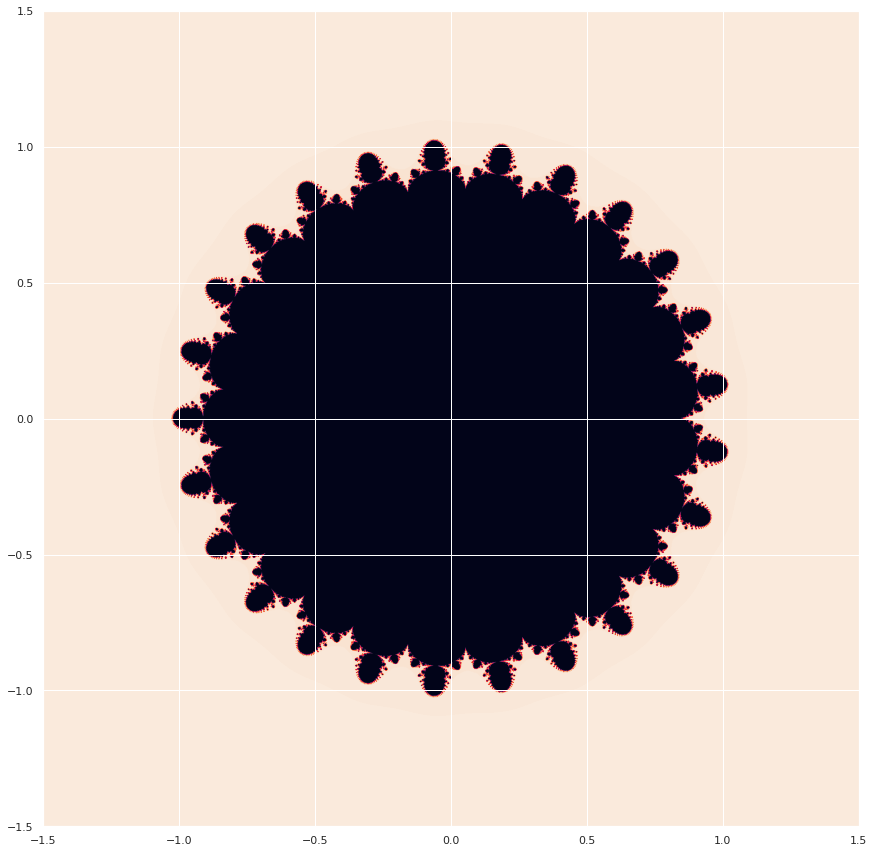

In [129]:
plt.figure(figsize=(15, 15))
plt.imshow(escape, extent=(x_min, x_max, y_min, y_max))

Orbit Traps

In [133]:
orbit_trap = 0 + 0j

In [175]:
def create_orbit_fractal(c, orbit_pt = 0 + 0j, deg = 2):
    x0 = np.zeros_like(c) # x0 = 0
    x = x0

    distances = np.ones_like(np.abs(c)) * 10

    for iter in range(100):
        x = f(x, c, deg=deg)

        z_minus = x.copy()
        z_minus = z_minus - orbit_pt
        idx = np.abs(z_minus) < 10
        distances[idx] = np.minimum(distances[idx], np.abs(z_minus[idx]))

    return distances

In [173]:
x_min, x_max = -2.5, 2
y_min, y_max = -1.5, 1.5

delta = 0.001

re, im = np.mgrid[x_min:x_max:delta, y_min:y_max:delta]

c = (re + 1j*im).T

distances = create_orbit_fractal(c)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in power
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in power
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: RuntimeWarning: overflow encountered in absolute
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in less
  if sys.path[0] == '':


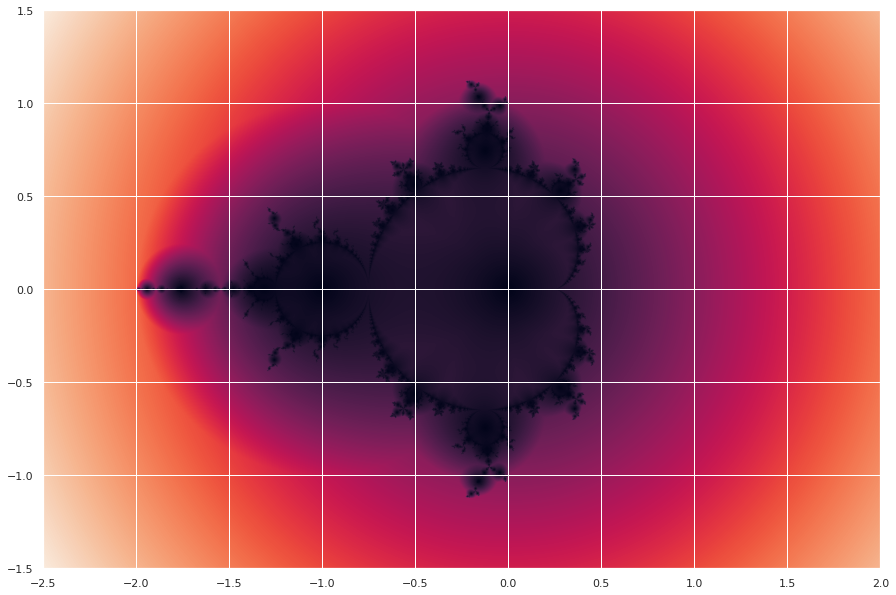

In [174]:
plt.figure(figsize=(15, 15))
plt.imshow(distances, extent=(x_min, x_max, y_min, y_max))

In [178]:
x_min, x_max = -1.3, 1.3
y_min, y_max = -1.3, 1.3

delta = 0.001

re, im = np.mgrid[x_min:x_max:delta, y_min:y_max:delta]

c = (re + 1j*im).T

distances = create_orbit_fractal(c, deg=6)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in power
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in power
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: RuntimeWarning: overflow encountered in absolute
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in less
  if sys.path[0] == '':


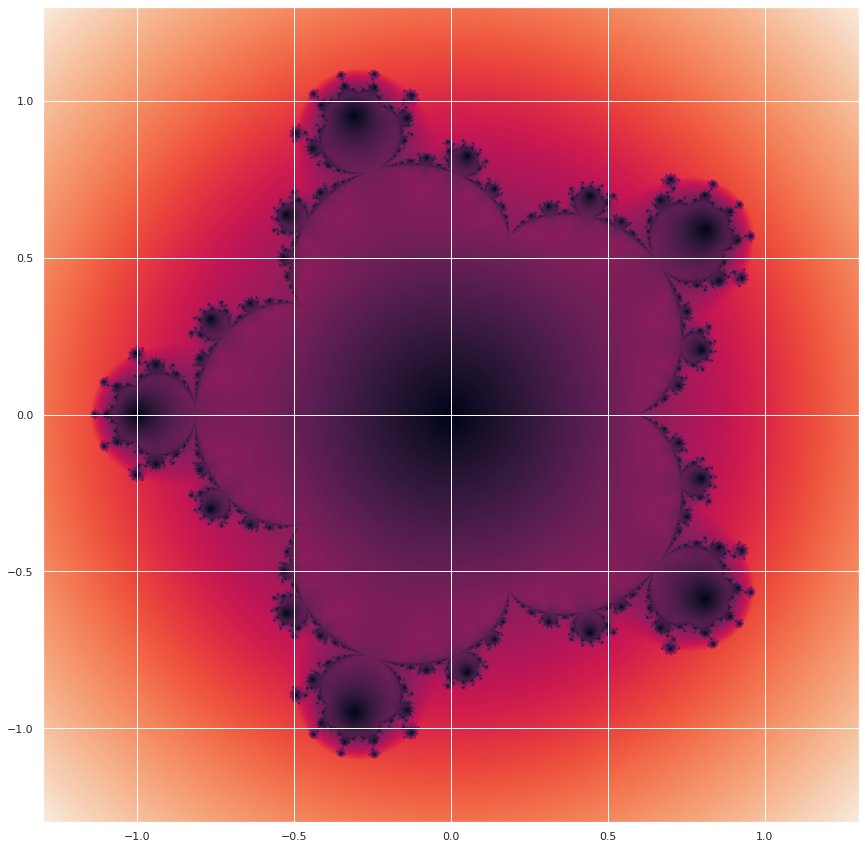

In [179]:
plt.figure(figsize=(15, 15))
plt.imshow(distances, extent=(x_min, x_max, y_min, y_max))

In [63]:
# shortest distance of a point from a circle
def circle_dist(x, rad = 5.0):
    return np.abs(np.abs(x) - rad)

In [64]:
def create_orbit_fractal(c, deg = 2, dist_func = circle_dist):
    x0 = np.zeros_like(c) # x0 = 0
    x = x0

    distances = np.ones_like(np.abs(c)) * 10

    for iter in range(100):
        x = f(x, c, deg=deg)

        z_minus = x.copy()
        z_minus = dist_func(z_minus)
        idx = np.abs(z_minus) < 10
        distances[idx] = np.minimum(distances[idx], np.abs(z_minus[idx]))

    return distances

def create_orbit_fractal_julia(grid, deg = 2, dist_func = circle_dist):
    x = grid # x0 = (x, y)

    c = np.zeros_like(grid)
    c.fill(0.3 + 0.6j) # c = 0.3 + 0.6j

    distances = np.ones_like(np.abs(c)) * 10

    for iter in range(100):
        x = f(x, c, deg=deg)

        z_minus = x.copy()
        z_minus = dist_func(z_minus)
        idx = np.abs(z_minus) < 10
        distances[idx] = np.minimum(distances[idx], np.abs(z_minus[idx]))

    return distances

In [195]:
x_min, x_max = -2.5, 2
y_min, y_max = -1.5, 1.5

delta = 0.001

re, im = np.mgrid[x_min:x_max:delta, y_min:y_max:delta]

c = (re + 1j*im).T

distances = create_orbit_fractal(c)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in power
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in power
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in absolute
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in less
  if sys.path[0] == '':


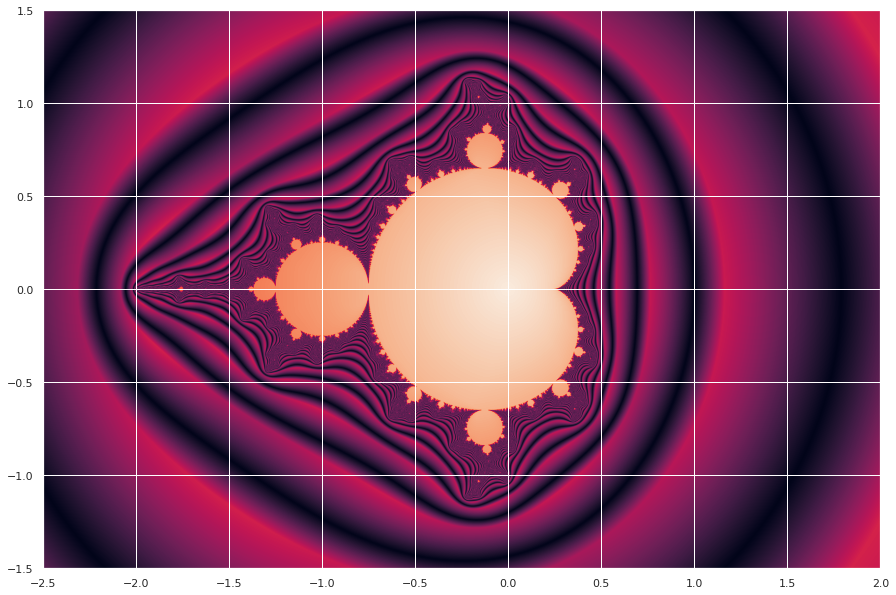

In [196]:
plt.figure(figsize=(15, 15))
plt.imshow(distances, extent=(x_min, x_max, y_min, y_max))

In [74]:
x_min, x_max = -1.5, 1.5
y_min, y_max = -1.5, 1.5

delta = 0.001

re, im = np.mgrid[x_min:x_max:delta, y_min:y_max:delta]

c = (re + 1j*im).T

distances = create_orbit_fractal_julia(c, dist_func = partial(circle_dist, rad = 10))

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in power
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in power
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in absolute
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:30: RuntimeWarning: invalid value encountered in less


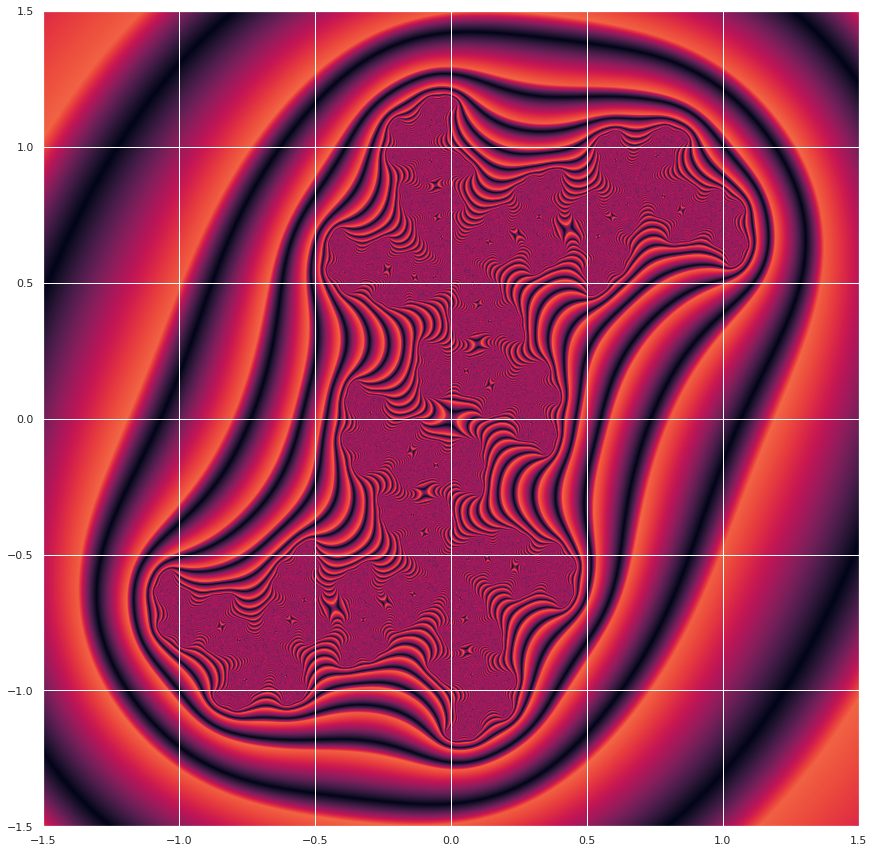

In [75]:
plt.figure(figsize=(15, 15))
plt.imshow(distances, extent=(x_min, x_max, y_min, y_max))

In [198]:
x_min, x_max = -2.5, 2
y_min, y_max = -1.5, 1.5

delta = 0.001

re, im = np.mgrid[x_min:x_max:delta, y_min:y_max:delta]

c = (re + 1j*im).T

distances = create_orbit_fractal(c, dist_func = partial(circle_dist, rad=2))

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in power
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in power
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in absolute
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in less
  if sys.path[0] == '':


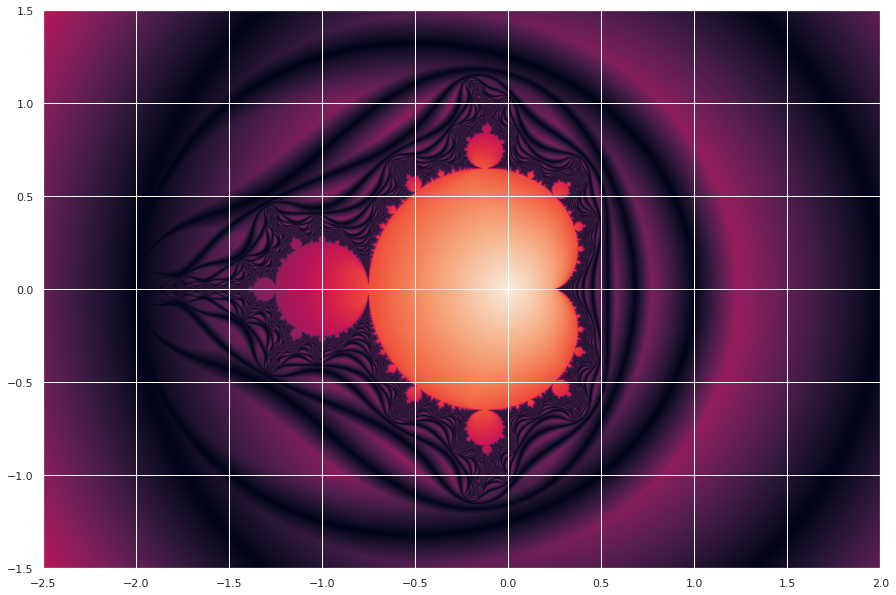

In [199]:
plt.figure(figsize=(15, 15))
plt.imshow(distances, extent=(x_min, x_max, y_min, y_max))

In [200]:
x_min, x_max = -2.5, 2
y_min, y_max = -1.5, 1.5

delta = 0.001

re, im = np.mgrid[x_min:x_max:delta, y_min:y_max:delta]

c = (re + 1j*im).T

distances = create_orbit_fractal(c, dist_func = partial(circle_dist, rad=0.5))

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in power
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in power
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in absolute
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in less
  if sys.path[0] == '':


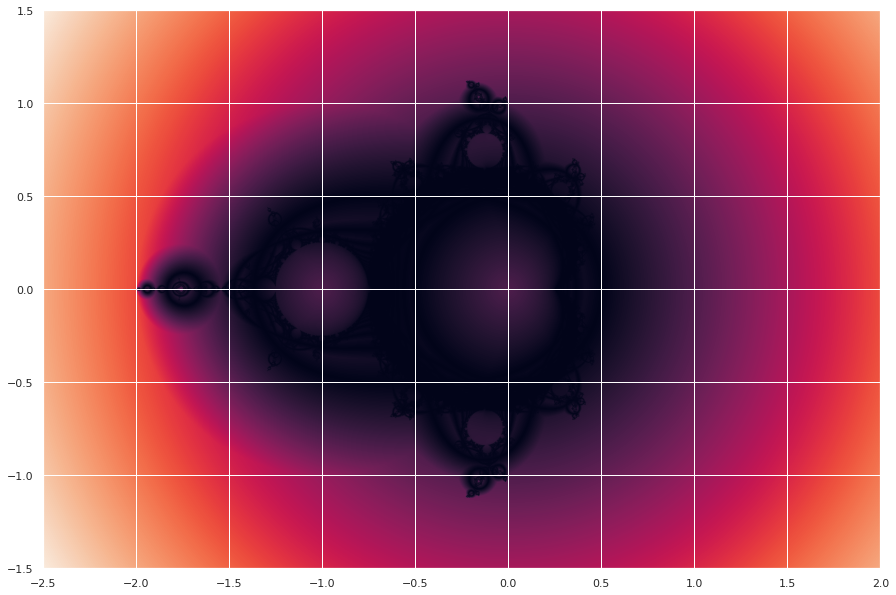

In [205]:
plt.figure(figsize=(15, 15))
plt.imshow(distances, extent=(x_min, x_max, y_min, y_max))

In [206]:
x_min, x_max = -2.5, 2
y_min, y_max = -1.5, 1.5

delta = 0.001

re, im = np.mgrid[x_min:x_max:delta, y_min:y_max:delta]

c = (re + 1j*im).T

distances = create_orbit_fractal(c, deg=6)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in power
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in power
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in absolute
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in less
  if sys.path[0] == '':


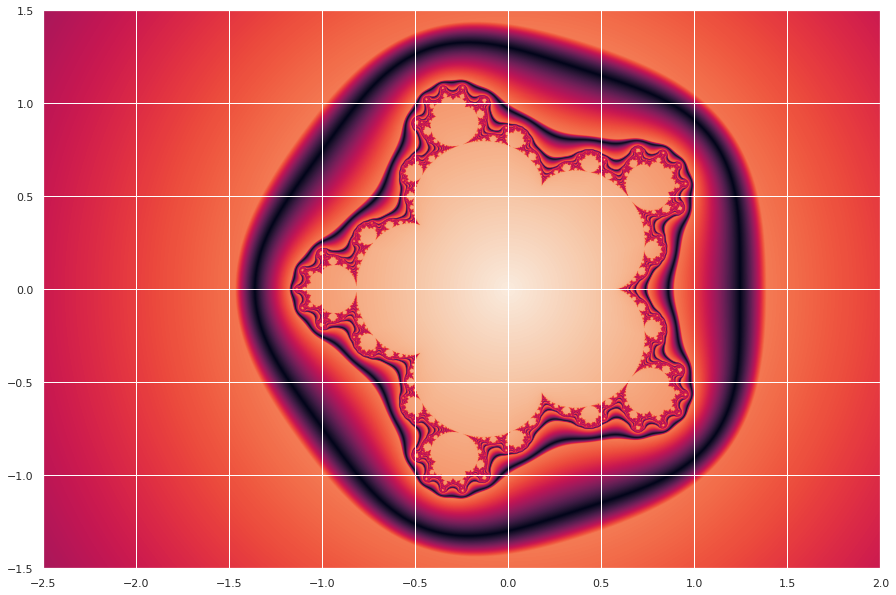

In [207]:
plt.figure(figsize=(15, 15))
plt.imshow(distances, extent=(x_min, x_max, y_min, y_max))

# Image Orbit Trap

In [30]:
! wget -O mona.jpg https://upload.wikimedia.org/wikipedia/commons/thumb/e/ec/Mona_Lisa%2C_by_Leonardo_da_Vinci%2C_from_C2RMF_retouched.jpg/600px-Mona_Lisa%2C_by_Leonardo_da_Vinci%2C_from_C2RMF_retouched.jpg

--2020-10-29 23:00:14--  https://upload.wikimedia.org/wikipedia/commons/thumb/e/ec/Mona_Lisa%2C_by_Leonardo_da_Vinci%2C_from_C2RMF_retouched.jpg/600px-Mona_Lisa%2C_by_Leonardo_da_Vinci%2C_from_C2RMF_retouched.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 198.35.26.112, 2620:0:863:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|198.35.26.112|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 174160 (170K) [image/jpeg]
Saving to: ‘mona.jpg’

mona.jpg            100%[===================>] 170.08K  --.-KB/s    in 0.07s   

2020-10-29 23:00:14 (2.48 MB/s) - ‘mona.jpg’ saved [174160/174160]



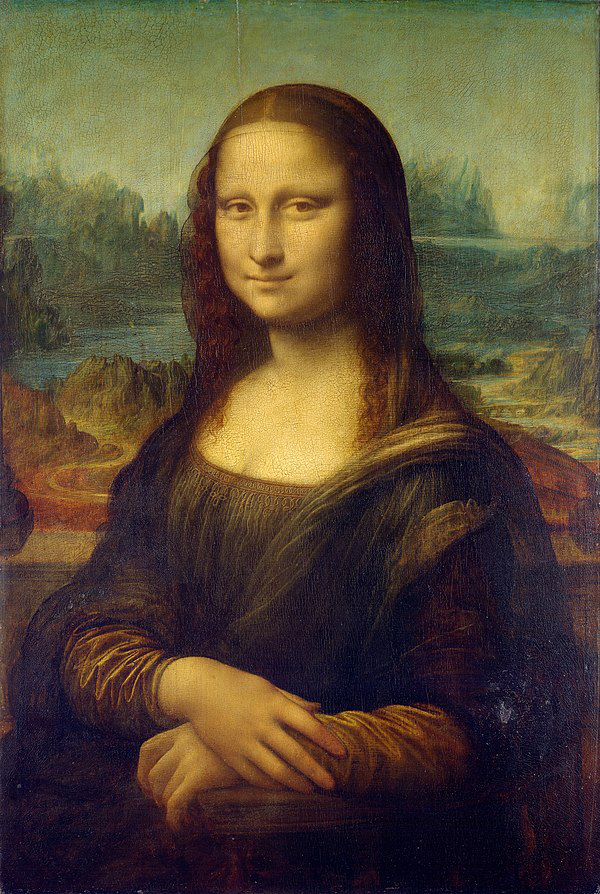

In [31]:
img = Image.open('mona.jpg')
img

In [77]:
# this is really really slow
def create_image_fractal(c, image, deg = 2):
    x0 = np.zeros_like(c) # x0 = 0
    x = x0

    btmleft = (-0.5, -0.5)
    topright = (0.5, 0.5)
    trap_size = (1.0, 1.0)

    fractal = np.zeros((*(np.abs(c).shape), 3))
    trapped = np.zeros_like(np.abs(c))

    for iter in tqdm(range(100)):
        x = f(x, c, deg=deg)

        idx = (trapped == 0) & (np.abs(x) < 10) & ( (x.real > btmleft[0]) & (x.real < topright[0])) & ((x.imag > btmleft[1]) & (x.imag < topright[1]))

        with np.nditer(x, flags=['multi_index'], op_flags=['readonly']) as it:
            for point in it:
                if trapped[it.multi_index] == 0 and (np.abs(point) < 10) and (point.real > btmleft[0] and point.real < topright[0]) and (point.imag > btmleft[1] and point.imag < topright[1]):
                    trapped[it.multi_index] = 1
                    fractal[it.multi_index] = np.array(
                            image.getpixel(
                                (
                                    int( ( point.imag + 0.5 ) * image.width ),
                                    int( ( point.real + 0.5 ) * image.height  )
                                )
                            )
                        )

    return fractal

In [78]:
def create_image_fractal2(c, image, deg = 2):
    x0 = np.zeros_like(c) # x0 = 0
    x = x0

    btmleft = (-0.5, -0.5)
    topright = (0.5, 0.5)
    trap_size = (1.0, 1.0)

    fractal = np.zeros((*(np.abs(c).shape), 3))
    trapped = np.zeros_like(np.abs(c))

    with np.nditer(x, flags=['multi_index'], op_flags=['readwrite']) as it:
        for point in tqdm(it, total=x.size):
            for iter in range(100):
                point[...] = f(point, c[it.multi_index], deg)

                # if this point was trapped previously then break
                if (abs(point) > 10) or trapped[it.multi_index] == 1:
                    break
                
                # check if this point can be trapped
                if (point.real > btmleft[0] and point.real < topright[0]) and (point.imag > btmleft[1] and point.imag < topright[1]):
                    trapped[it.multi_index] = 1
                    # print(
                    #     np.array(
                    #         image.getpixel(
                    #             (
                    #                 int( ( point.imag + 0.5 ) * image.width ),
                    #                 int( ( point.real + 0.5 ) * image.height  )
                    #             )
                    #         )
                    #     )
                    # )
                    fractal[it.multi_index] = np.array(
                            image.getpixel(
                                (
                                    int( ( point.imag + 0.5 ) * image.width ),
                                    int( ( point.real + 0.5 ) * image.height  )
                                )
                            )
                        )

    return fractal

In [79]:
def create_image_fractal3(c, image, deg = 2):
    x0 = np.zeros_like(c) # x0 = 0
    x = x0

    btmleft = (-0.5, -0.5)
    topright = (0.5, 0.5)
    trap_size = (1.0, 1.0)

    fractal = np.zeros((*(np.abs(c).shape), 3))
    trapped = np.zeros_like(np.abs(c))

    with np.nditer(x, flags=['multi_index'], op_flags=['readwrite']) as it:
        for point in tqdm(it, total=x.size):
            for iter in range(100):
                point[...] = f(point, c[it.multi_index], deg)

                # if this point was trapped previously then break
                if (abs(point) > 10) or trapped[it.multi_index] == 1:
                    break
                
                # check if this point can be trapped
                if (point.real > btmleft[0] and point.real < topright[0]) and (point.imag > btmleft[1] and point.imag < topright[1]):
                    trapped[it.multi_index] = 1
                    fractal[it.multi_index] = np.array(
                            image.getpixel(
                                (
                                    int( ( point.real + 0.5 ) * image.width ),
                                    int( ( point.imag + 0.5 ) * image.height  )
                                )
                            )
                        )

    return fractal

In [50]:
def create_image_fractal_julia(grid, image, deg = 2):

    x = grid

    c = np.zeros_like(x)
    c.fill(0.3 + 0.6j)

    btmleft = (-0.5, -0.5)
    topright = (0.5, 0.5)
    trap_size = (1.0, 1.0)

    fractal = np.zeros((*(np.abs(c).shape), 3))
    trapped = np.zeros_like(np.abs(c))

    with np.nditer(x, flags=['multi_index'], op_flags=['readwrite']) as it:
        for point in tqdm(it, total=x.size):
            for iter in range(100):
                point[...] = f(point, c[it.multi_index], deg)

                # if this point was trapped previously then break
                if (abs(point) > 10) or trapped[it.multi_index] == 1:
                    break
                
                # check if this point can be trapped
                if (point.real > btmleft[0] and point.real < topright[0]) and (point.imag > btmleft[1] and point.imag < topright[1]):
                    trapped[it.multi_index] = 1
                    pixel =  (
                                int( ( point.real + 0.5 ) * (image.width  - 1) ),
                                int( ( point.imag + 0.5 ) * (image.height - 1) )
                            )
                    try:
                        fractal[it.multi_index] = np.array(
                                image.getpixel(
                                    pixel
                                )
                            )
                    except:
                        print(f'ERROR: pixel: ({int( ( point.real + 0.5 ) * image.width )}, {int( ( point.imag + 0.5 ) * image.height  )}), point: ({point})')

    return fractal

In [137]:
x_min, x_max = -2.5, 2
y_min, y_max = -1.5, 1.5

delta = 0.001

re, im = np.mgrid[x_min:x_max:delta, y_min:y_max:delta]

c = (re + 1j*im).T

fractal = create_image_fractal3(c, img)

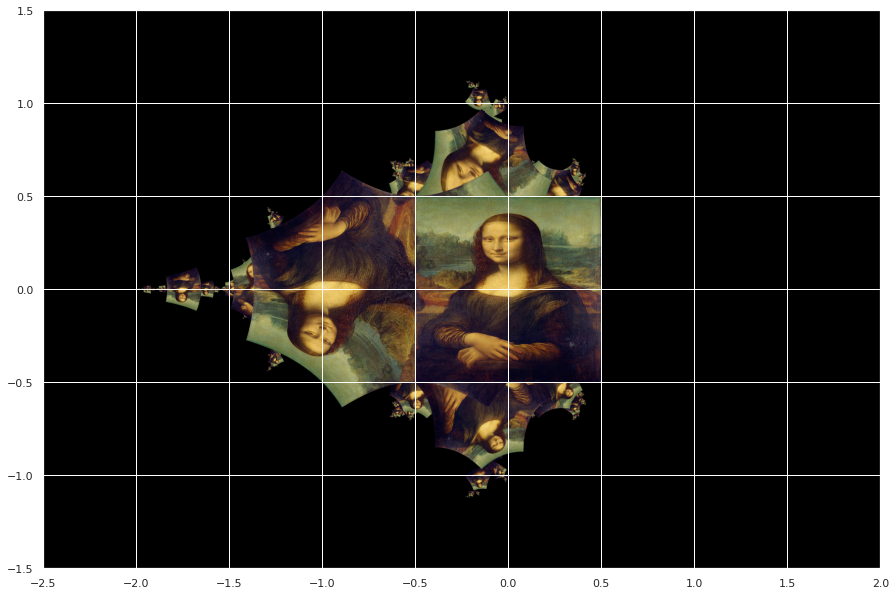

In [138]:
plt.figure(figsize=(15, 15))
plt.imshow(fractal.astype(np.uint8), extent=(x_min, x_max, y_min, y_max))

In [133]:
x_min, x_max = -2.5, 2
y_min, y_max = -1.5, 1.5

delta = 0.01

re, im = np.mgrid[x_min:x_max:delta, y_min:y_max:delta]

c = (re + 1j*im).T

fractal = create_image_fractal3(c, img)

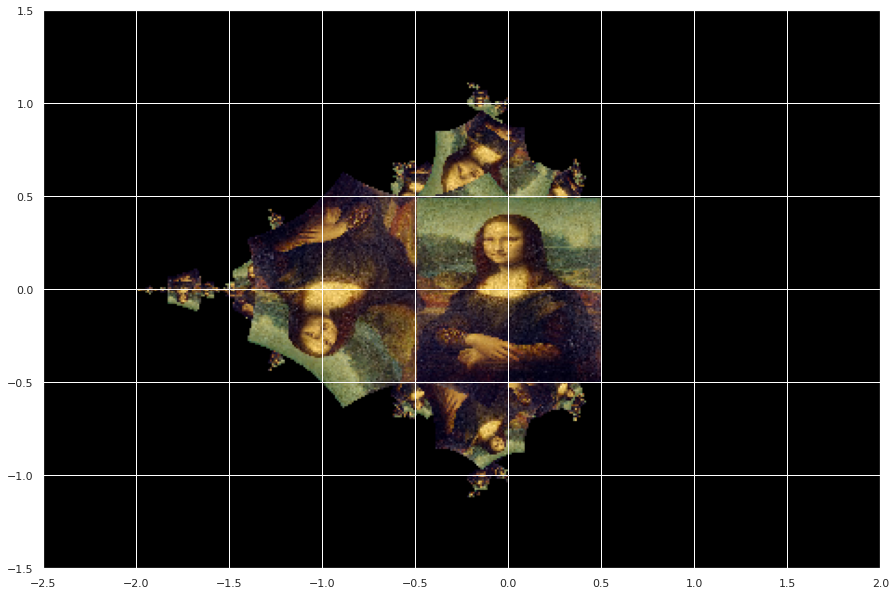

In [134]:
plt.figure(figsize=(15, 15))
plt.imshow(fractal.astype(np.uint8), extent=(x_min, x_max, y_min, y_max))

In [51]:
x_min, x_max = -1.5, 1.5
y_min, y_max = -1.5, 1.5

delta = 0.001

re, im = np.mgrid[x_min:x_max:delta, y_min:y_max:delta]

c = (re + 1j*im).T

fractal = create_image_fractal_julia(c, img)

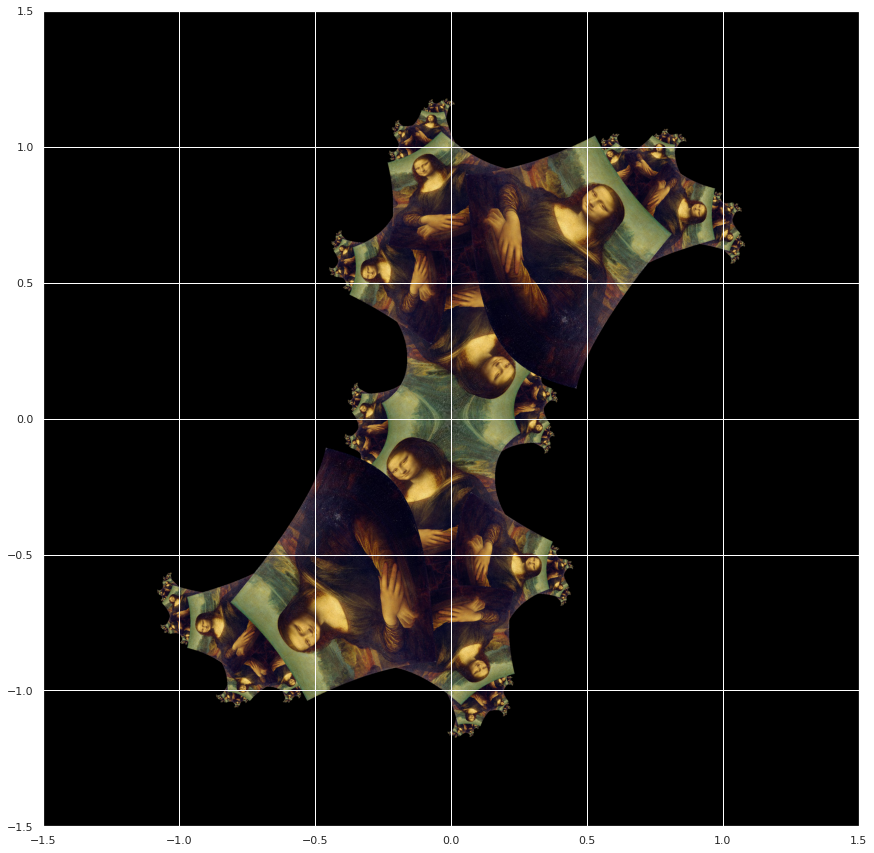

In [52]:
plt.figure(figsize=(15, 15))
plt.imshow(fractal.astype(np.uint8), extent=(x_min, x_max, y_min, y_max))

In [135]:
x_min, x_max = -1, 1
y_min, y_max = -1.5, 1.5

delta = 0.001

re, im = np.mgrid[x_min:x_max:delta, y_min:y_max:delta]

c = (re + 1j*im).T

fractal = create_image_fractal3(c, img, deg=3)


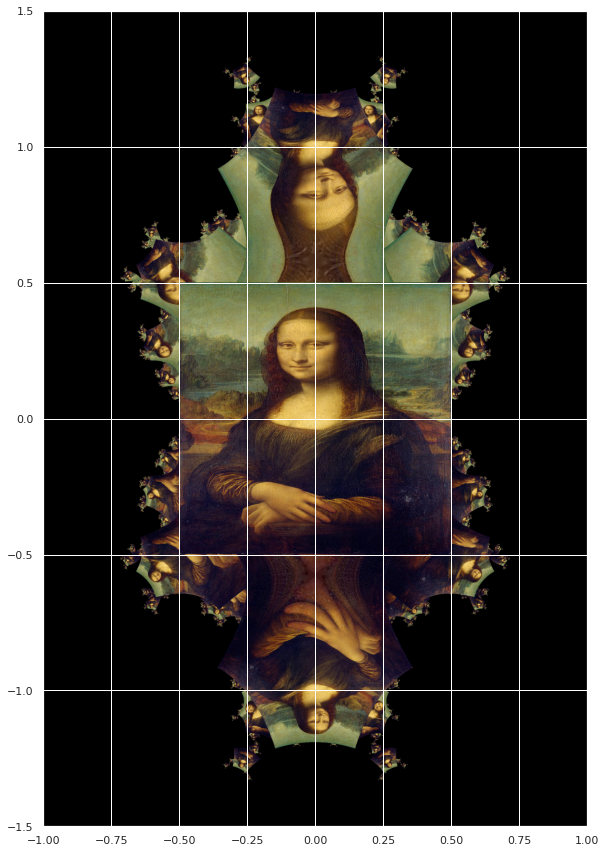

In [136]:
plt.figure(figsize=(15, 15))
plt.imshow(fractal.astype(np.uint8), extent=(x_min, x_max, y_min, y_max))

In [88]:
x_min, x_max = -1.5, 1.5
y_min, y_max = -1.5, 1.5

delta = 0.001

re, im = np.mgrid[x_min:x_max:delta, y_min:y_max:delta]

c = (re + 1j*im).T

fractal = create_image_fractal3(c, img, deg=4)


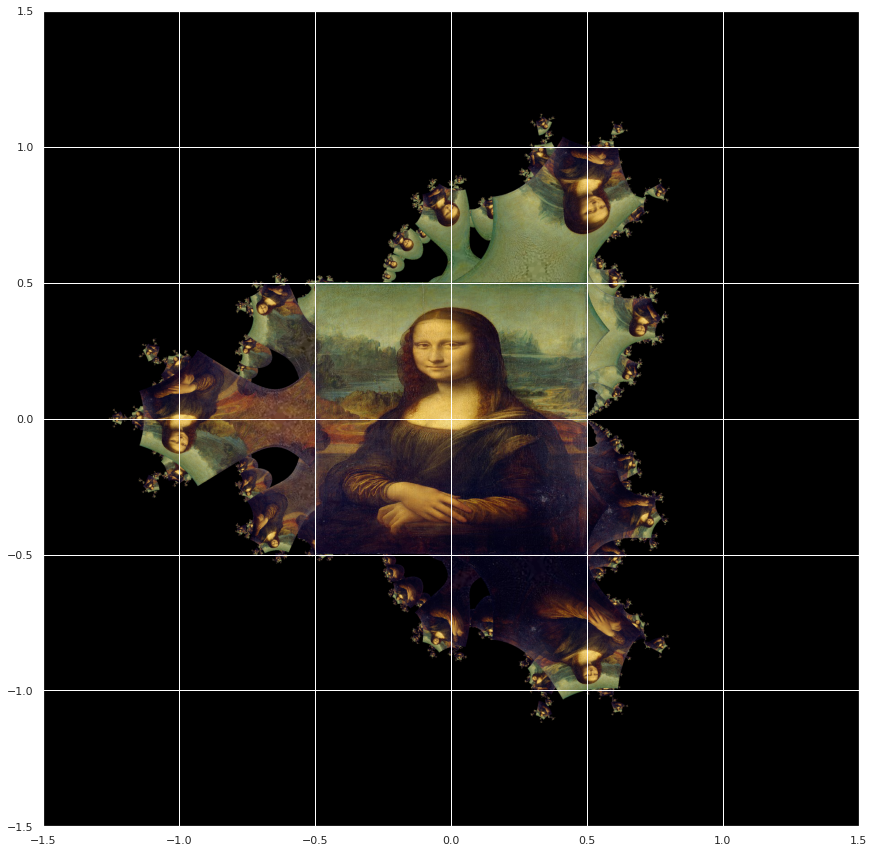

In [89]:
plt.figure(figsize=(15, 15))
plt.imshow(fractal.astype(np.uint8), extent=(x_min, x_max, y_min, y_max))

In [90]:
x_min, x_max = -1.5, 1.5
y_min, y_max = -1.5, 1.5

delta = 0.001

re, im = np.mgrid[x_min:x_max:delta, y_min:y_max:delta]

c = (re + 1j*im).T

fractal = create_image_fractal3(c, img, deg=5)


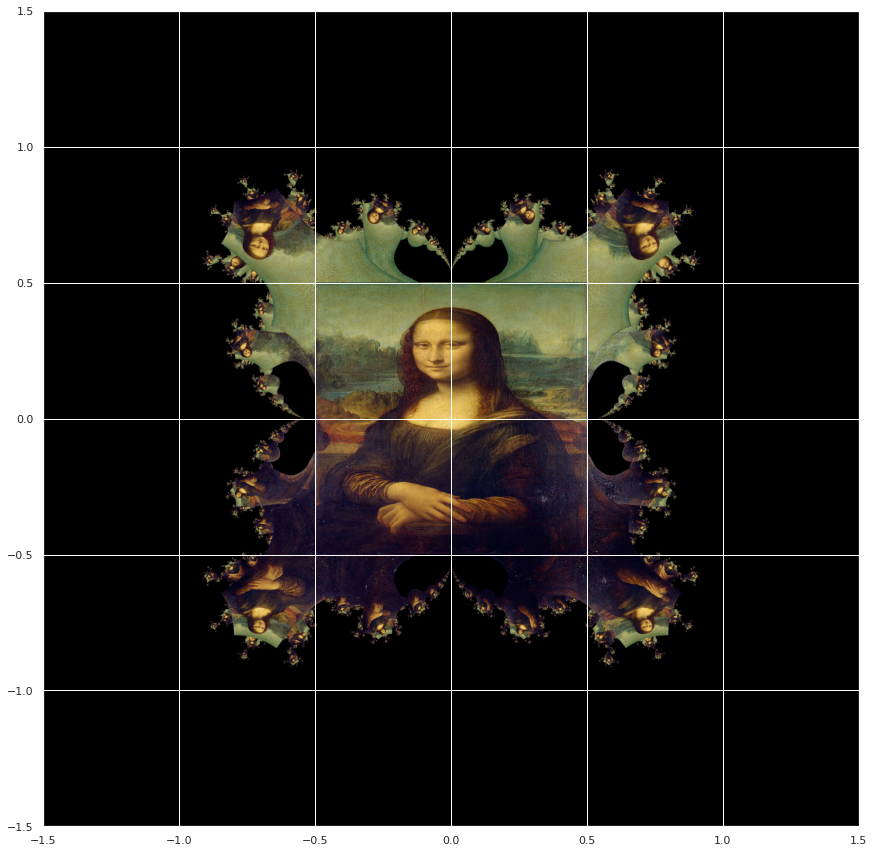

In [91]:
plt.figure(figsize=(15, 15))
plt.imshow(fractal.astype(np.uint8), extent=(x_min, x_max, y_min, y_max))

In [92]:
x_min, x_max = -1.5, 1.5
y_min, y_max = -1.5, 1.5

delta = 0.001

re, im = np.mgrid[x_min:x_max:delta, y_min:y_max:delta]

c = (re + 1j*im).T

fractal = create_image_fractal3(c, img, deg=6)


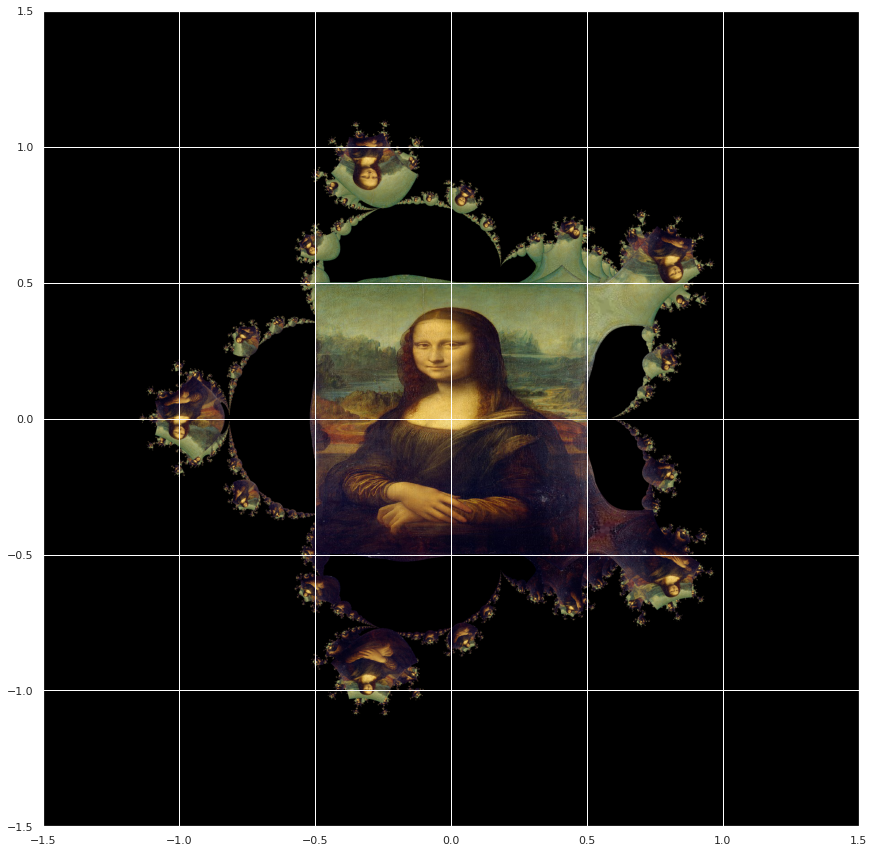

In [93]:
plt.figure(figsize=(15, 15))
plt.imshow(fractal.astype(np.uint8), extent=(x_min, x_max, y_min, y_max))

In [97]:
x_min, x_max = -1.5, 1.5
y_min, y_max = -1.5, 1.5

delta = 0.001

re, im = np.mgrid[x_min:x_max:delta, y_min:y_max:delta]

c = (re + 1j*im).T

fractal = create_image_fractal_julia(c, img, deg=3)

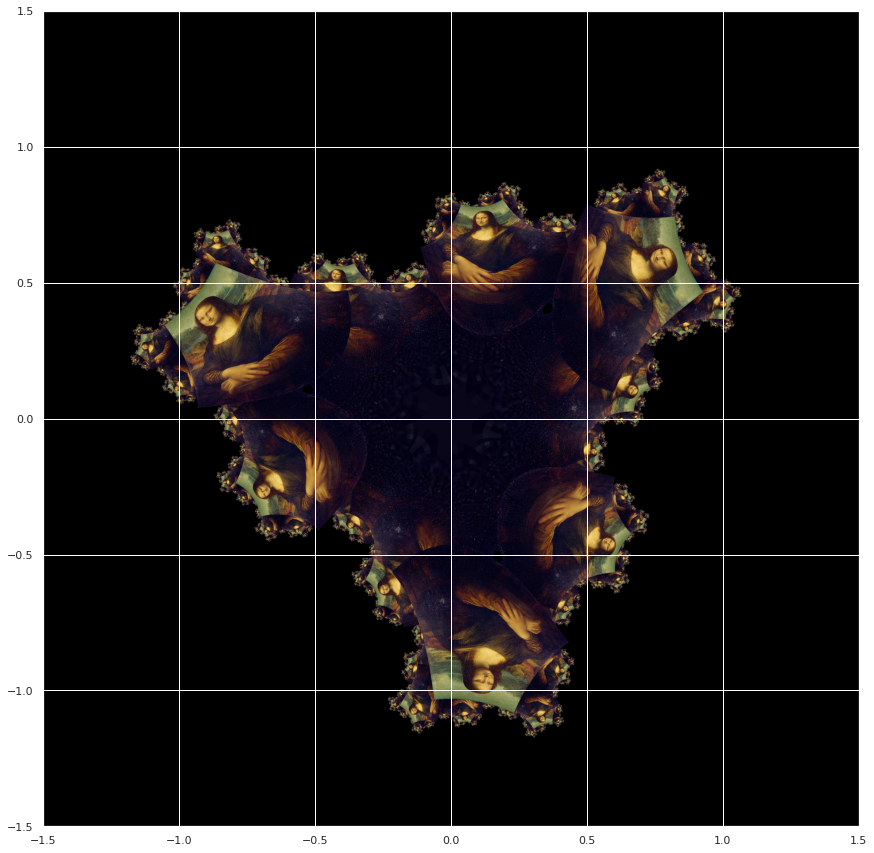

In [98]:
plt.figure(figsize=(15, 15))
plt.imshow(fractal.astype(np.uint8), extent=(x_min, x_max, y_min, y_max))

In [95]:
x_min, x_max = -1.5, 1.5
y_min, y_max = -1.5, 1.5

delta = 0.001

re, im = np.mgrid[x_min:x_max:delta, y_min:y_max:delta]

c = (re + 1j*im).T

fractal = create_image_fractal_julia(c, img, deg=5)

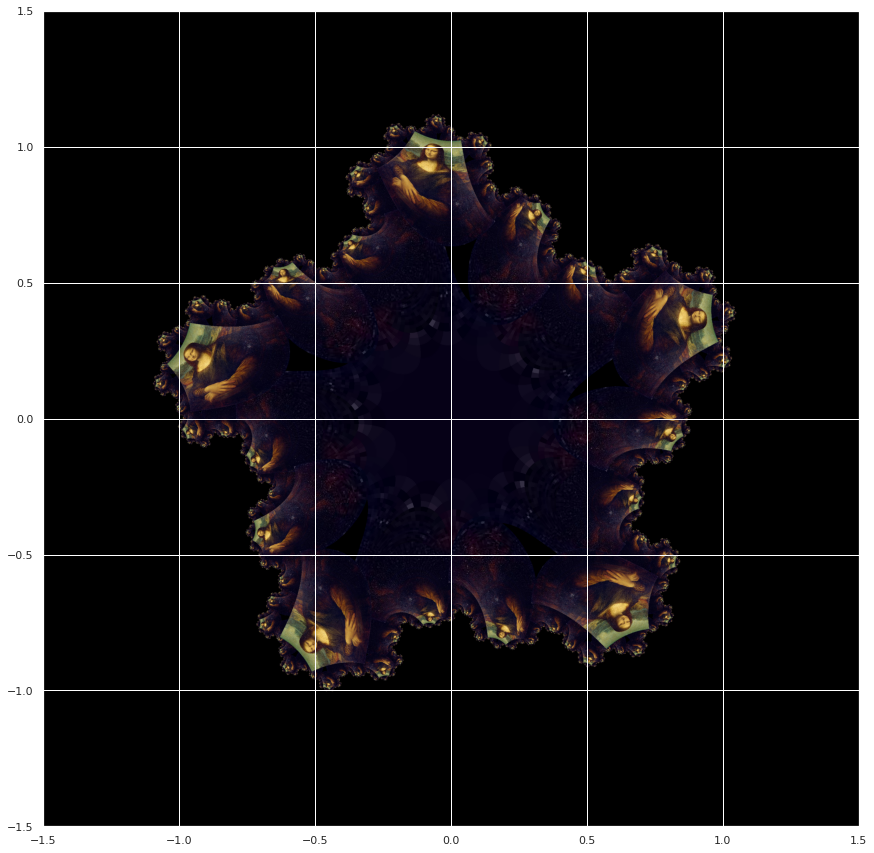

In [96]:
plt.figure(figsize=(15, 15))
plt.imshow(fractal.astype(np.uint8), extent=(x_min, x_max, y_min, y_max))

In [53]:
x_min, x_max = -1.5, 1.5
y_min, y_max = -1.5, 1.5

delta = 0.001

re, im = np.mgrid[x_min:x_max:delta, y_min:y_max:delta]

c = (re + 1j*im).T

fractal = create_image_fractal_julia(c, img, deg=6)

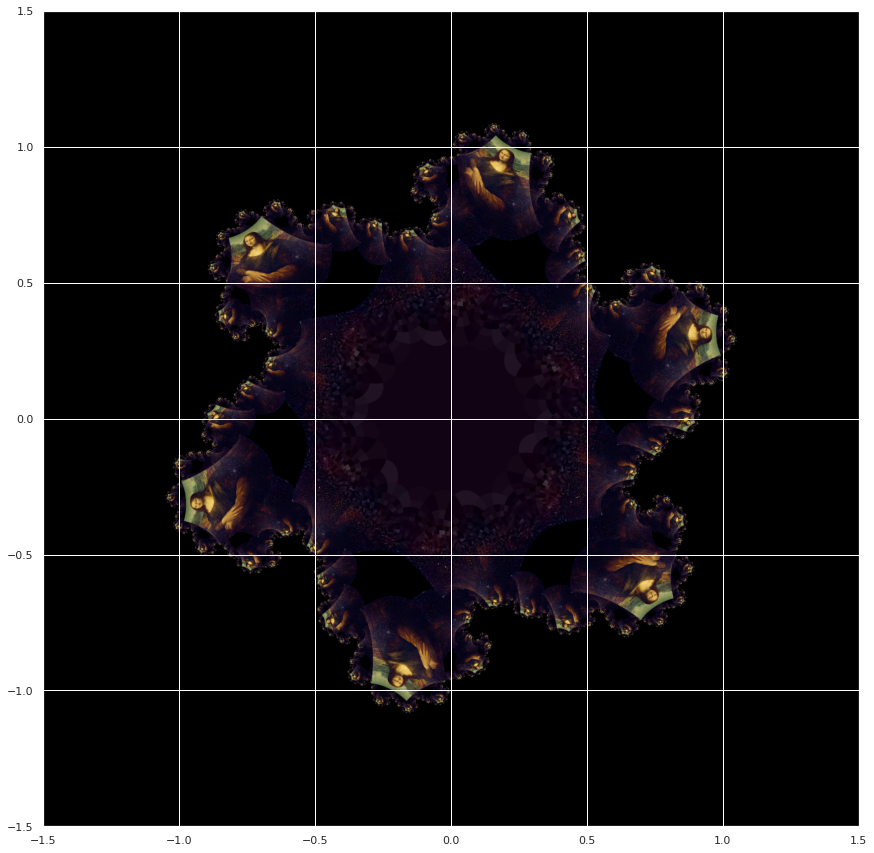

In [54]:
plt.figure(figsize=(15, 15))
plt.imshow(fractal.astype(np.uint8), extent=(x_min, x_max, y_min, y_max))

In [130]:
fractal.shape

(3000, 2000, 3)